In [1]:
!pip install polyglot
!pip install pyicu
!pip install pycld2
!pip install morfessor

import numpy as np
import pandas as pd
import folium
import nltk
from os import path
from PIL import Image
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
from gensim.corpora.dictionary import Dictionary
from gensim.models.tfidfmodel import TfidfModel
import re
from collections import Counter
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
from collections import defaultdict
import polyglot
from polyglot.text import Text

nltk.download('punkt')
nltk.download('words')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')

!polyglot download embeddings2.en
!polyglot download ner2.en

     |████████████████████████████████| 133kB 4.9MB/s 
  Created wheel for polyglot: filename=polyglot-16.7.4-py2.py3-none-any.whl size=52559 sha256=8602b9ef47cb90c6975bf655c4b1403a3dd25dd21f61819d68b7421fbc86c843
  Stored in directory: /root/.cache/pip/wheels/5e/91/ef/f1369fdc1203b0a9347d4b24f149b83a305f39ab047986d9da
Successfully built polyglot
     |████████████████████████████████| 215kB 4.8MB/s 
  Created wheel for pyicu: filename=PyICU-2.3.1-cp36-cp36m-linux_x86_64.whl size=1173005 sha256=aceedfda9528a91f6d4837d80199b83b5472aa9206b342e74f00c86fca5cd583
  Stored in directory: /root/.cache/pip/wheels/3f/45/7e/ccee9f1fe52787595e92641b5645cdf2cb40096749b39b4422
Successfully built pyicu
     |████████████████████████████████| 14.3MB 28kB/s 
  Created wheel for pycld2: filename=pycld2-0.31-cp36-cp36m-linux_x86_64.whl size=9825510 sha256=e34cdfe325068860700ddd32c67c39444c98cc8697f89b427dcbb988670848fd
  Stored in directory: /root/.cache/pip/wheels/7b/44/44/ec4c5e25e095f02aa0e63ef2bf0cc8

In [3]:
#First upload the latest version of the dataset

report_1 = pd.read_csv('Safety_GPS1.csv') #Latest version from Ana
report_1 = report_1[pd.notna(report_1['DESCRIPTION'])]
print('shape of the complete dataset: ', report_1.shape)

#Category list extracted from harassment_risk_base.ipynb: https://colab.research.google.com/drive/1VZz4WC1MSujnKN3GN1OcOJBImz9uDaKe
category_list = ['Touching /Groping','Catcalls/Whistles', 'Sexual Invites', 'Stalking', 'Others', 'Commenting',
                 'Rape / Sexual Assault', 'North East India Report', 'Indecent exposure', 'Chain Snatching', 
                 'Ogling/Facial Expressions/Staring', 'Taking pictures', 'Poor / No Street Lighting', 'Online Harassment']
print('\nUnique-category list: {}'.format(category_list))

#Split in train and test
split_rate = 0.8
print('\nsplit is done at row number ', int(report_1.shape[0]*split_rate))
df_train = report_1.iloc[0:int(report_1.shape[0]*split_rate), :].copy()
df_test = report_1.iloc[int(report_1.shape[0]*split_rate)+1:,: ].copy()
print('train shape ', df_train.shape)
print('test shape {}\n'.format(df_test.shape))

text = ['']*len(category_list)
df_filtered_list = []
counter = 0

for category in category_list:
  df_filtered_list.append(df_train[df_train['CATEGORY'].str.contains(category)==True])

for index in range(len(df_filtered_list)):
  for description in df_filtered_list[index].DESCRIPTION:
    text[index] = text[index] + ' ' + str(description)
    counter+=1
    if counter == int(report_1.shape[0]*split_rate):
      break

print('Collections sizes (# of chars) build from DESCRIPTION column for each category: \n') #, category_list[0],': ', len(text[0]))
for index, category in enumerate(category_list):
  print(category,': ', len(text[index]))

category_list_names = []

bad_chars = ['/', ' '] 

for category in category_list:
  for i in bad_chars:
    category = category.replace(i, '')
  category_list_names.append(category.replace(i, ''))

print('\ncollections_names: ', category_list_names)                               

for category, description in zip(category_list_names, text):
  f = open(category+'.txt',"w+")
  f.write(description)
  
#TODO: make functions of split_df() and collection_builder()

shape of the complete dataset:  (11055, 40)

Unique-category list: ['Touching /Groping', 'Catcalls/Whistles', 'Sexual Invites', 'Stalking', 'Others', 'Commenting', 'Rape / Sexual Assault', 'North East India Report', 'Indecent exposure', 'Chain Snatching', 'Ogling/Facial Expressions/Staring', 'Taking pictures', 'Poor / No Street Lighting', 'Online Harassment']

split is done at row number  8844
train shape  (8844, 40)
test shape (2210, 40)

Collections sizes (# of chars) build from DESCRIPTION column for each category: 

Touching /Groping :  307360
Catcalls/Whistles :  215039
Sexual Invites :  138632
Stalking :  122242
Others :  106449
Commenting :  167885
Rape / Sexual Assault :  69085
North East India Report :  3738
Indecent exposure :  72119
Chain Snatching :  27730
Ogling/Facial Expressions/Staring :  210835
Taking pictures :  63932
Poor / No Street Lighting :  43801
Online Harassment :  68

collections_names:  ['TouchingGroping', 'CatcallsWhistles', 'SexualInvites', 'Stalking', 'Ot

In [0]:
#Manually chose the largest collections for initial testing
largest_collections = ['TouchingGroping', 'CatcallsWhistles', 'SexualInvites', 'Stalking', 'Others', 'Commenting', 'OglingFacialExpressionsStaring']

In [0]:
#This is to run TextSimilary algorithm later
test_sample = df_test[df_test['CATEGORY'].str.contains(category_list[0])==True]
print(test_sample.iloc[10,4])
f = open('unknown.txt',"w+")
f.write(test_sample.iloc[10,4])

### Tokenization + Lemmatization + Stemming

In [0]:
def top_20(filename, stemming=True, lemmatization=True, plot=True):
  lemmatizer = WordNetLemmatizer()
  stemmer = PorterStemmer()
  category = open(filename, 'r')
  content = category.read().lower()
  
  #I could also do it by ranges to indenty just english words...
  pattern_wd_eng = (r'[A-Za-z]+') 
  
  print('\words and digits eng :\n', re.findall(pattern_wd_eng, content))
  print('\nse() unique words and digits eng :\n', set(re.findall(pattern_wd_eng, content)))

  tokens = re.findall(pattern_wd_eng, content)
  no_stops = [t for t in tqdm(tokens) if t not in stopwords.words('english')]
  print('\nafter nostop filter :\n', no_stops)
  top_20_a = Counter(no_stops).most_common(20)
  print('\ntop 20 most used words after non_stop:\n', top_20_a)
  lemmatized = [lemmatizer.lemmatize(word, pos="v") for word in no_stops]
  print('\nafter lemmatizer :\n', lemmatized)
  top_20_b = Counter(lemmatized).most_common(20)
  print('\ntop 20 most used words after lemmatizer:\n', top_20_b)
  stemmed = [stemmer.stem(word) for word in lemmatized]
  print('\nafter stemmer :\n', stemmed)
  top_20 = Counter(stemmed).most_common(20)
  print('\ntop 20 most used words after stemmer:\n', top_20)
  labels = [word[0] for word in top_20]
  values = [word[1] for word in top_20]
  if plot:
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 5)
    plt.bar(labels, values, color='g')
    plt.show()
  total_tokens = lemmatized if lemmatization else no_stops
  total_tokens = stemmed if stemming else total_tokens
  return labels, values, total_tokens

TouchingGroping
\words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'bo



after nostop filter :
 ['school', 'auto', 'driver', 'always', 'use', 'stare', 'try', 'talk', 'whenever', 'alone', 'auto', 'also', 'tries', 'touch', 'complained', 'mother', 'listen', 'problems', 'boyfriend', 'likes', 'touching', 'every', 'time', 'sent', 'shop', 'tells', 'go', 'place', 'like', 'tried', 'stop', 'refuses', 'boys', 'like', 'disturbing', 'touching', 'private', 'parts', 'walking', 'home', 'boy', 'comes', 'catches', 'buttocks', 'breast', 'problem', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'man', 'touching', 'hand', 'travelling', 'public', 'auto', 'asked', 'clearly', 'refused', 'pretended', 'innocent', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'one', 'day', 'saw', 'man', 'snatching', 'one', 'lady', 'dupatta', 'one', 'helping', 'boy', 'classmate', 'loves', 'touching', 'private', 'parts', 'threatens', 'say', 'any

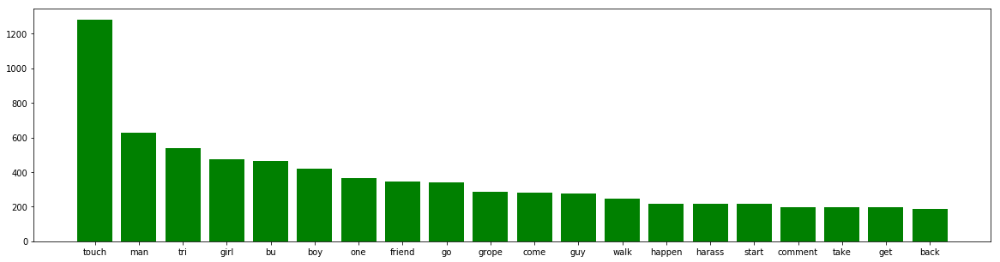

CatcallsWhistles
\words and digits eng :
 ['i', 'was', 'in', 'market', 'with', 'my', 'mom', 'there', 'i', 'saw', 'a', 'man', 'was', 'sitting', 'beside', 'a', 'shop', 'and', 'he', 'was', 'continuously', 'staring', 'a', 'girl', 'after', 'sometime', 'he', 'started', 'whistling', 'at', 'her', 'was', 'walking', 'by', 'the', 'town', 'library', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'a', 'boy', 'in', 'class', 'seven', 'is', 'calling', 'a', 'girl', 'his', 'sweet', 'baby', 'a', 'girl', 'senior', 'from', 'me', 'who', 'lived', 'in', 'my', 'apartment', 'was', 'harassed', 'by', 'group', 'of', 'boys', 'everdag', 'they', 'form', 'a', 'group', 'with', 'their', 'bike', 'and', 'harass', 'her', 'by', 'whistling', 'touching', 'and', 'commenting', 'a', 'girl', 'says', 'there', 'is', 'a', 'man', 'who', 'loves', 'disturbing', 'her', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 



after nostop filter :
 ['market', 'mom', 'saw', 'man', 'sitting', 'beside', 'shop', 'continuously', 'staring', 'girl', 'sometime', 'started', 'whistling', 'walking', 'town', 'library', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'class', 'seven', 'calling', 'girl', 'sweet', 'baby', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'girl', 'says', 'man', 'loves', 'disturbing', 'sent', 'shop', 'parents', 'girl', 'says', 'lives', 'person', 'sex', 'calls', 'beutiful', 'girl', 'says', 'walking', 'boys', 'call', 'refuses', 'want', 'beat', 'young', 'men', 'commenting', 'girl', 'short', 'skirts', 'sexy', 'hot', 'boys', 'call', 'girl', 'wherever', 'meet', 'also', 'run', 'girl', 'usually', 'hide', 'cant', 'seen', 'girl', 'wondering', 'want', 'man', 'making', 'catcalls', 'girl', 'passing', 'boys', 'catcalling', 'girl', 'passing', 'near', 'boys', 'whistling', 'gi

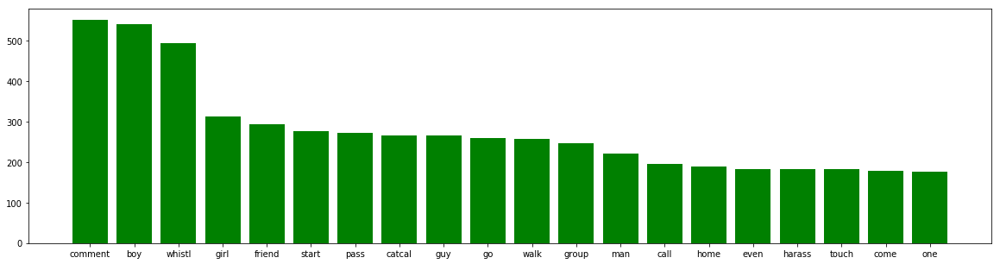

SexualInvites
\words and digits eng :
 ['there', 'is', 'a', 'girl', 'whom', 'boys', 'have', 'been', 'writing', 'a', 'letter', 'to', 'her', 'and', 'putting', 'in', 'her', 'bag', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'disturbed', 'y', 'a', 'boy', 'in', 'the', 'school', 'there', 'are', 'some', 'boys', 'who', 'likes', 'disturbing', 'a', 'girl', 'when', 'she', 'in', 'class', 'even', 'if', 'she', 'has', 'been', 'sent', 'they', 'follow', 'him', 'there', 'is', 'a', 'teacher', 'who', 'likes', 'touching', 'a', 'girl', 'on', 'the', 'breast', 'a', 'girl', 'is', 'asking', 'if', 'a', 'boy', 'comes', 'to', 'your', 'house', 'so', 'that', 'they', 'can', 'do', 'assignment', 'together', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'forced', 'by', 'a', 'boy', 'to', 'love', 'him', 'but', 'she', 'is', 'against', 'it', 'he', 'even', 'threatens', 'to', 'kill', 'her', 'if', 'she', 'don', 't', 'do', 'so', 'in', 'our', 'school', 'there', 'is', 'a', 'male', 'teacher', 'who', 'follows', 'pupils', 



after nostop filter :
 ['girl', 'boys', 'writing', 'letter', 'putting', 'bag', 'girl', 'disturbed', 'boy', 'school', 'boys', 'likes', 'disturbing', 'girl', 'class', 'even', 'sent', 'follow', 'teacher', 'likes', 'touching', 'girl', 'breast', 'girl', 'asking', 'boy', 'comes', 'house', 'assignment', 'together', 'girl', 'forced', 'boy', 'love', 'even', 'threatens', 'kill', 'school', 'male', 'teacher', 'follows', 'pupils', 'starts', 'touching', 'girl', 'disturbed', 'boy', 'even', 'wants', 'touch', 'private', 'parts', 'twelve', 'years', 'even', 'call', 'wife', 'everyday', 'girl', 'sent', 'shop', 'disturbs', 'man', 'man', 'like', 'following', 'following', 'girl', 'afraid', 'telling', 'parents', 'girl', 'sent', 'shop', 'met', 'man', 'way', 'wanted', 'rape', 'screamed', 'help', 'running', 'neighbor', 'man', 'calls', 'asks', 'go', 'buy', 'something', 'come', 'back', 'forces', 'sleep', 'boy', 'following', 'girl', 'school', 'cousin', 'raped', 'year', 'ago', 'boy', 'disturbs', 'know', 'even', 'fe

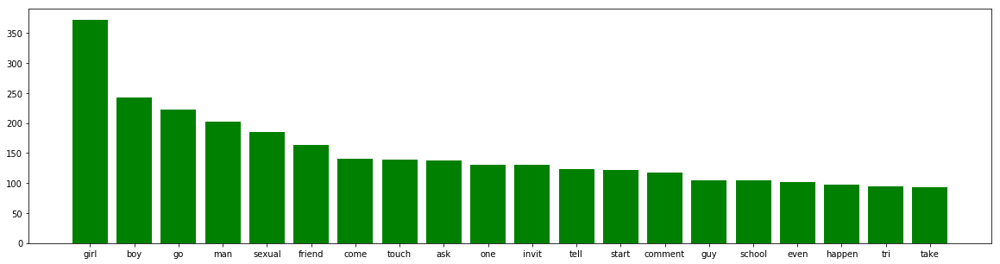

Stalking
\words and digits eng :
 ['guy', 'just', 'started', 'following', 'me', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'there', 'is', 'a', 'boy', 'who', 'likes', 'to', 'follow', 'me', 'and', 'i', 'don', 't', 'know', 'what', 'to', 'do', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'commenting', 'and', 'intentionally', 'bumping', 'into', 'my', 'cousin', 'a', 'boy', 'was', 'following', 'me', 'while', 'i', 'was', 'coming', 'back', 'from', 'school', 'there', 'is', 'a', 'boy', 'who', 'comes', 'at', 'our', 'shop', 'and', 'says', 'he', 'wants', 'us', 'to', 'be', 'friends', 'but', 'i', 'refused', 'if', 'he', 'follows', 'me', 'what', 'should', 'i', 'do', 'a', 'girl', 'reported', 'that', 'the', 'man', 'has', 'been', 'telling', 'her', 'to', 'go', 'into', 'his', 'house', 'with', 'this', 'man', 'many', 'times', 'and', 'refuse



after nostop filter :
 ['guy', 'started', 'following', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'likes', 'follow', 'know', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'boy', 'following', 'coming', 'back', 'school', 'boy', 'comes', 'shop', 'says', 'wants', 'us', 'friends', 'refused', 'follows', 'girl', 'reported', 'man', 'telling', 'go', 'house', 'man', 'many', 'times', 'refused', 'buying', 'sweets', 'biscuits', 'girl', 'man', 'following', 'girl', 'anytime', 'saw', 'new', 'boy', 'school', 'stalking', 'went', 'friends', 'water', 'park', 'group', 'boys', 'stalked', 'commented', 'us', 'two', 'men', 'stalked', 'going', 'alone', 'towards', 'auto', 'stand', 'stalking', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'went', 'family', 'trip', 'blue', 'world', 'waterpark', 'one', 'person', 'continuous', 'watching', 'going', 'h

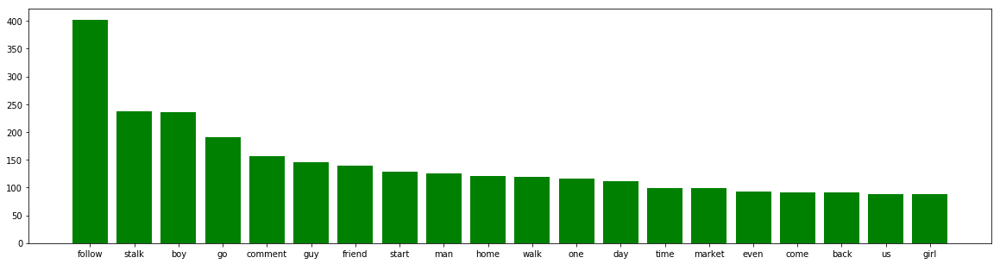

Others
\words and digits eng :
 ['there', 'is', 'a', 'girl', 'who', 'loves', 'having', 'sex', 'and', 'getting', 'paid', 'then', 'she', 'buys', 'sweets', 'for', 'us', 'but', 'she', 'wants', 'to', 'stop', 'the', 'habit', 'what', 'should', 'she', 'do', 'if', 'a', 'boy', 'insists', 'in', 'having', 'sex', 'with', 'you', 'what', 'should', 'you', 'do', 'if', 'a', 'boy', 'comes', 'and', 'asks', 'you', 'if', 'you', 'can', 'be', 'his', 'girlfriend', 'why', 'do', 'you', 'always', 'keep', 'him', 'in', 'your', 'mind', 'and', 'even', 'if', 'you', 'don', 't', 'see', 'him', 'after', 'a', 'long', 'time', 'i', 'still', 'think', 'of', 'him', 'what', 'should', 'i', 'do', 'what', 'can', 'a', 'girl', 'do', 'when', 'she', 'feels', 'like', 'having', 'sex', 'and', 'she', 'does', 'not', 'want', 'to', 'break', 'her', 'virginity', 'what', 'if', 'your', 'boyfriend', 'wants', 'a', 'kiss', 'i', 'have', 'a', 'boyfriend', 'and', 'is', 'disturbing', 'really', 'disturbing', 'what', 'can', 'i', 'do', 'if', 'a', 'boy', 't



after nostop filter :
 ['girl', 'loves', 'sex', 'getting', 'paid', 'buys', 'sweets', 'us', 'wants', 'stop', 'habit', 'boy', 'insists', 'sex', 'boy', 'comes', 'asks', 'girlfriend', 'always', 'keep', 'mind', 'even', 'see', 'long', 'time', 'still', 'think', 'girl', 'feels', 'like', 'sex', 'want', 'break', 'virginity', 'boyfriend', 'wants', 'kiss', 'boyfriend', 'disturbing', 'really', 'disturbing', 'boy', 'tells', 'loves', 'really', 'means', 'love', 'tell', 'refuses', 'uncle', 'touched', 'private', 'parts', 'day', 'greeted', 'refused', 'felt', 'like', 'disrespected', 'sex', 'get', 'hiv', 'aids', 'boy', 'buys', 'school', 'staffs', 'accept', 'refuse', 'group', 'boys', 'came', 'bike', 'snatched', 'one', 'lady', 'purse', 'ran', 'away', 'mother', 'sex', 'infected', 'man', 'hiv', 'girl', 'asks', 'people', 'sex', 'hard', 'girls', 'say', 'boy', 'says', 'love', 'bad', 'friend', 'boy', 'trust', 'boy', 'disturbs', 'daily', 'abuse', 'verbally', 'boy', 'tells', 'prove', 'love', 'asks', 'kiss', 'girls

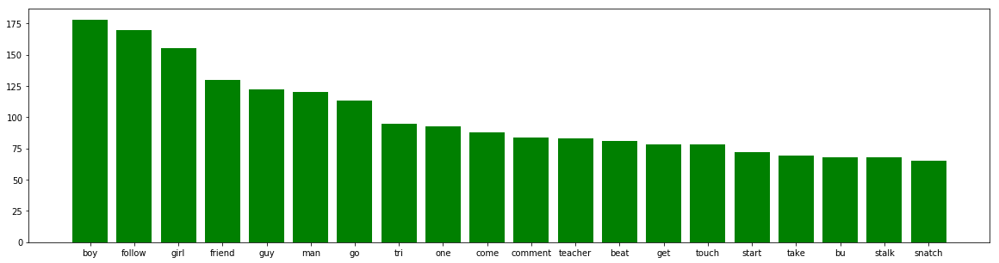

Commenting
\words and digits eng :
 ['i', 'always', 'feel', 'shy', 'when', 'i', 'pass', 'past', 'boys', 'there', 'is', 'a', 'boy', 'who', 'tried', 'to', 'kiss', 'me', 'and', 'i', 'accepted', 'there', 'is', 'a', 'boy', 'who', 'is', 'disturbing', 'me', 'is', 'it', 'healthy', 'to', 'have', 'sex', 'while', 'still', 'in', 'your', 'menstrual', 'cycle', 'if', 'a', 'boy', 'hugs', 'you', 'inappropriately', 'what', 'should', 'you', 'do', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'and', 'i', 'dont', 'know', 'what', 'to', 'do', 'if', 'your', 'periods', 'take', 'long', 'time', 'to', 'appear', 'what', 'might', 'be', 'wrong', 'if', 'a', 'boy', 'is', 'disturbing', 'you', 'and', 'you', 'have', 'refused', 'and', 'he', 'still', 'follows', 'you', 'what', 'do', 'you', 'do', 'and', 'if', 'a', 'boy', 'tells', 'you', 'to', 'have', 'sex', 'with', 'him', 'and', 'he', 'pays', 'you', 'what', 'should', 'you', 'do', 'what', 'can', 'you', 'do', 'when', 'a', 'boy', 'tells', 'you', 'he', 'wants', 



after nostop filter :
 ['always', 'feel', 'shy', 'pass', 'past', 'boys', 'boy', 'tried', 'kiss', 'accepted', 'boy', 'disturbing', 'healthy', 'sex', 'still', 'menstrual', 'cycle', 'boy', 'hugs', 'inappropriately', 'boy', 'likes', 'disturbing', 'dont', 'know', 'periods', 'take', 'long', 'time', 'appear', 'might', 'wrong', 'boy', 'disturbing', 'refused', 'still', 'follows', 'boy', 'tells', 'sex', 'pays', 'boy', 'tells', 'wants', 'friend', 'pregnant', 'years', 'parents', 'friends', 'sayind', 'abort', 'friend', 'saw', 'friend', 'mine', 'touched', 'boy', 'please', 'help', 'sheila', 'love', 'somebody', 'class', 'tell', 'someone', 'tells', 'loves', 'ready', 'wait', 'till', 'finiosh', 'school', 'never', 'force', 'anything', 'want', 'bad', 'condom', 'protective', 'sex', 'experiencing', 'monthly', 'period', 'get', 'pregnant', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'coming', 'back', 'dance', 'boy', 'commenting', 'uncle', 'daughter', 'elde

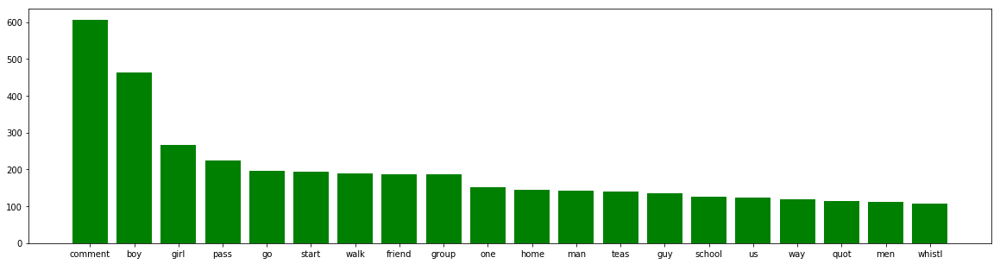

OglingFacialExpressionsStaring
\words and digits eng :
 ['one', 'day', 'i', 'was', 'playing', 'in', 'garden', 'of', 'my', 'house', 'my', 'friend', 'called', 'me', 'she', 'used', 'to', 'live', 'on', 'the', 'next', 'side', 'of', 'the', 'road', 'a', 'boy', 'started', 'making', 'faces', 'at', 'my', 'friend', 'and', 'me', 'first', 'we', 'ignored', 'it', 'but', 'he', 'didn', 't', 'stopped', 'i', 'gave', 'him', 'tight', 'slap', 'and', 'asked', 'him', 'to', 'leave', 'a', 'man', 'looked', 'at', 'a', 'girl', 'as', 'she', 'was', 'walking', 'along', 'the', 'road', 'boys', 'who', 'were', 'drinking', 'and', 'smoking', 'were', 'staring', 'at', 'me', 'i', 'was', 'going', 'through', 'auto', 'and', 'the', 'guy', 'sitting', 'opposite', 'me', 'was', 'continuously', 'staring', 'me', 'from', 'top', 'to', 'bottom', 'and', 'the', 'made', 'me', 'feel', 'really', 'uncomfortable', 'me', 'and', 'my', 'friend', 'were', 'having', 'fast', 'food', 'and', 'a', 'group', 'of', 'boys', 'were', 'continuously', 'staring', 



after nostop filter :
 ['one', 'day', 'playing', 'garden', 'house', 'friend', 'called', 'used', 'live', 'next', 'side', 'road', 'boy', 'started', 'making', 'faces', 'friend', 'first', 'ignored', 'stopped', 'gave', 'tight', 'slap', 'asked', 'leave', 'man', 'looked', 'girl', 'walking', 'along', 'road', 'boys', 'drinking', 'smoking', 'staring', 'going', 'auto', 'guy', 'sitting', 'opposite', 'continuously', 'staring', 'top', 'bottom', 'made', 'feel', 'really', 'uncomfortable', 'friend', 'fast', 'food', 'group', 'boys', 'continuously', 'staring', 'us', 'stalking', 'girl', 'felt', 'shy', 'walking', 'men', 'looking', 'ogling', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'lights', 'around', 'hostel', 'gets', 'dark', 'evening', 'harassment', 'becomevwry', 'common', 'often', 'hear', 'comment', 'dress', 'body', 'roads', 'somewhere', 'learnt', 'live', 'boys', 'often', 'comment', 'girls', 'common', 'normal', 'dr

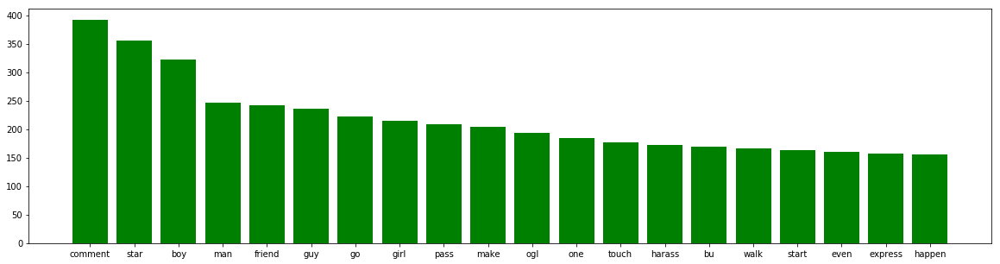

In [0]:
print(largest_collections[0])
labels_1, values_1, tokens_1 = top_20(largest_collections[0]+'.txt')
print(largest_collections[1])
labels_2, values_2, tokens_2 = top_20(largest_collections[1]+'.txt')
print(largest_collections[2])
labels_3, values_3, tokens_3 = top_20(largest_collections[2]+'.txt')
print(largest_collections[3])
labels_4, values_4, tokens_4 = top_20(largest_collections[3]+'.txt')
print(largest_collections[4])
labels_5, values_5, tokens_5 = top_20(largest_collections[4]+'.txt')
print(largest_collections[5])
labels_6, values_6, tokens_6 = top_20(largest_collections[5]+'.txt')
print(largest_collections[6])
labels_7, values_7, tokens_7 = top_20(largest_collections[6]+'.txt')

#TODO: make list comprenhension

### Tf_idf

In [0]:
category_tokens = [tokens_1, tokens_2, tokens_3, tokens_4, tokens_5, tokens_6, tokens_7]
print(len(tokens_1), len(tokens_2))

# Build a dicitionary with all the unique tokens merging all categories
dictionary = Dictionary(category_tokens)

# Corpus: List(7 items) of list(for each collection) of tuples of word_id and count
corpus = [dictionary.doc2bow(collection) for collection in category_tokens]

# Example of first 5 tokens of Touching/Grouping collection
print(corpus[0])
for word_id, word_count in corpus[0][25:35]:
    print(dictionary.get(word_id), word_count)

29070 20313
[(0, 1), (1, 1), (2, 2), (3, 10), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 2), (10, 72), (11, 2), (12, 3), (13, 5), (14, 6), (15, 9), (16, 7), (17, 2), (18, 1), (19, 1), (20, 5), (21, 2), (22, 1), (23, 1), (24, 1), (25, 7), (26, 10), (27, 15), (28, 6), (29, 2), (30, 9), (31, 1), (32, 2), (33, 2), (34, 2), (35, 1), (36, 1), (37, 1), (38, 1), (39, 3), (40, 5), (41, 28), (42, 1), (43, 1), (44, 8), (45, 53), (46, 2), (47, 1), (48, 57), (49, 1), (50, 1), (51, 16), (52, 1), (53, 1), (54, 14), (55, 2), (56, 1), (57, 2), (58, 3), (59, 1), (60, 3), (61, 4), (62, 1), (63, 1), (64, 1), (65, 5), (66, 2), (67, 1), (68, 1), (69, 2), (70, 3), (71, 1), (72, 6), (73, 1), (74, 16), (75, 43), (76, 54), (77, 1), (78, 1), (79, 3), (80, 10), (81, 59), (82, 1), (83, 1), (84, 3), (85, 1), (86, 25), (87, 4), (88, 1), (89, 3), (90, 1), (91, 1), (92, 2), (93, 1), (94, 27), (95, 1), (96, 1), (97, 1), (98, 2), (99, 1), (100, 1), (101, 5), (102, 2), (103, 3), (104, 2), (105, 6), (106, 1), (107, 1), (

In [0]:
print('Top_20 after Term Frequency–Inverse Document Frequency')
# Create a new TfidfModel using the corpus: tfidf
tfidf = TfidfModel(corpus)

for index, tokens_and_Cnt in enumerate(corpus):
  print('\n', largest_collections[index])
# Calculate the tfidf weights of doc: tfidf_weights
  tfidf_weights = tfidf[tokens_and_Cnt]

# Sort the weights from highest to lowest: sorted_tfidf_weights
  sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)

# Print the top 5 weighted words
  for term_id, weight in sorted_tfidf_weights[:20]:
      print(dictionary.get(term_id), weight)

Top_20 after Term Frequency–Inverse Document Frequency

 TouchingGroping
pinch 0.19340188224686905
crow 0.15371472198259056
crotch 0.13450038173476672
yatayat 0.1237005415601004
brush 0.12156689741231767
queue 0.11133048740409036
workplac 0.10876324482519109
nose 0.09896043324808032
comput 0.0960717012391191
thursday 0.0960717012391191
spank 0.09393805709133639
tightli 0.08366403448091622
safec 0.0776279851701699
aman 0.07685736099129528
ja 0.07685736099129528
priest 0.07685736099129528
tempoo 0.07685736099129528
transgend 0.07685736099129528
vaha 0.07685736099129528
pakistan 0.07422032493606025

 CatcallsWhistles
skin 0.21669108029324202
inject 0.20195107117134037
wistl 0.1645549713448919
kiosk 0.13463404744756025
bamenda 0.13001464817594524
hoot 0.1163995652421036
mock 0.08793453828762401
idl 0.06775792937730843
candl 0.06731702372378012
chan 0.06731702372378012
dombivali 0.06731702372378012
hemi 0.06731702372378012
hkv 0.06731702372378012
idenau 0.06731702372378012
ksii 0.0673170237

In [0]:
#Try with different combinations of using stemmer or not, lemmatizer or not
labels_1, values_1, tokens_1 = top_20(largest_collections[0]+'.txt', stemming=False, plot=False)
labels_2, values_2, tokens_2 = top_20(largest_collections[1]+'.txt', stemming=False, plot=False)
labels_3, values_3, tokens_3 = top_20(largest_collections[2]+'.txt', stemming=False, plot=False)
labels_4, values_4, tokens_4 = top_20(largest_collections[3]+'.txt', stemming=False, plot=False)
labels_5, values_5, tokens_5 = top_20(largest_collections[4]+'.txt', stemming=False, plot=False)
labels_6, values_6, tokens_6 = top_20(largest_collections[5]+'.txt', stemming=False, plot=False)
labels_7, values_7, tokens_7 = top_20(largest_collections[6]+'.txt', stemming=False, plot=False)

\words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'comm



after nostop filter :
 ['school', 'auto', 'driver', 'always', 'use', 'stare', 'try', 'talk', 'whenever', 'alone', 'auto', 'also', 'tries', 'touch', 'complained', 'mother', 'listen', 'problems', 'boyfriend', 'likes', 'touching', 'every', 'time', 'sent', 'shop', 'tells', 'go', 'place', 'like', 'tried', 'stop', 'refuses', 'boys', 'like', 'disturbing', 'touching', 'private', 'parts', 'walking', 'home', 'boy', 'comes', 'catches', 'buttocks', 'breast', 'problem', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'man', 'touching', 'hand', 'travelling', 'public', 'auto', 'asked', 'clearly', 'refused', 'pretended', 'innocent', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'one', 'day', 'saw', 'man', 'snatching', 'one', 'lady', 'dupatta', 'one', 'helping', 'boy', 'classmate', 'loves', 'touching', 'private', 'parts', 'threatens', 'say', 'any



after nostop filter :
 ['market', 'mom', 'saw', 'man', 'sitting', 'beside', 'shop', 'continuously', 'staring', 'girl', 'sometime', 'started', 'whistling', 'walking', 'town', 'library', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'class', 'seven', 'calling', 'girl', 'sweet', 'baby', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'girl', 'says', 'man', 'loves', 'disturbing', 'sent', 'shop', 'parents', 'girl', 'says', 'lives', 'person', 'sex', 'calls', 'beutiful', 'girl', 'says', 'walking', 'boys', 'call', 'refuses', 'want', 'beat', 'young', 'men', 'commenting', 'girl', 'short', 'skirts', 'sexy', 'hot', 'boys', 'call', 'girl', 'wherever', 'meet', 'also', 'run', 'girl', 'usually', 'hide', 'cant', 'seen', 'girl', 'wondering', 'want', 'man', 'making', 'catcalls', 'girl', 'passing', 'boys', 'catcalling', 'girl', 'passing', 'near', 'boys', 'whistling', 'gi



after nostop filter :
 ['girl', 'boys', 'writing', 'letter', 'putting', 'bag', 'girl', 'disturbed', 'boy', 'school', 'boys', 'likes', 'disturbing', 'girl', 'class', 'even', 'sent', 'follow', 'teacher', 'likes', 'touching', 'girl', 'breast', 'girl', 'asking', 'boy', 'comes', 'house', 'assignment', 'together', 'girl', 'forced', 'boy', 'love', 'even', 'threatens', 'kill', 'school', 'male', 'teacher', 'follows', 'pupils', 'starts', 'touching', 'girl', 'disturbed', 'boy', 'even', 'wants', 'touch', 'private', 'parts', 'twelve', 'years', 'even', 'call', 'wife', 'everyday', 'girl', 'sent', 'shop', 'disturbs', 'man', 'man', 'like', 'following', 'following', 'girl', 'afraid', 'telling', 'parents', 'girl', 'sent', 'shop', 'met', 'man', 'way', 'wanted', 'rape', 'screamed', 'help', 'running', 'neighbor', 'man', 'calls', 'asks', 'go', 'buy', 'something', 'come', 'back', 'forces', 'sleep', 'boy', 'following', 'girl', 'school', 'cousin', 'raped', 'year', 'ago', 'boy', 'disturbs', 'know', 'even', 'fe



after nostop filter :
 ['guy', 'started', 'following', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'likes', 'follow', 'know', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'boy', 'following', 'coming', 'back', 'school', 'boy', 'comes', 'shop', 'says', 'wants', 'us', 'friends', 'refused', 'follows', 'girl', 'reported', 'man', 'telling', 'go', 'house', 'man', 'many', 'times', 'refused', 'buying', 'sweets', 'biscuits', 'girl', 'man', 'following', 'girl', 'anytime', 'saw', 'new', 'boy', 'school', 'stalking', 'went', 'friends', 'water', 'park', 'group', 'boys', 'stalked', 'commented', 'us', 'two', 'men', 'stalked', 'going', 'alone', 'towards', 'auto', 'stand', 'stalking', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'went', 'family', 'trip', 'blue', 'world', 'waterpark', 'one', 'person', 'continuous', 'watching', 'going', 'h



after nostop filter :
 ['girl', 'loves', 'sex', 'getting', 'paid', 'buys', 'sweets', 'us', 'wants', 'stop', 'habit', 'boy', 'insists', 'sex', 'boy', 'comes', 'asks', 'girlfriend', 'always', 'keep', 'mind', 'even', 'see', 'long', 'time', 'still', 'think', 'girl', 'feels', 'like', 'sex', 'want', 'break', 'virginity', 'boyfriend', 'wants', 'kiss', 'boyfriend', 'disturbing', 'really', 'disturbing', 'boy', 'tells', 'loves', 'really', 'means', 'love', 'tell', 'refuses', 'uncle', 'touched', 'private', 'parts', 'day', 'greeted', 'refused', 'felt', 'like', 'disrespected', 'sex', 'get', 'hiv', 'aids', 'boy', 'buys', 'school', 'staffs', 'accept', 'refuse', 'group', 'boys', 'came', 'bike', 'snatched', 'one', 'lady', 'purse', 'ran', 'away', 'mother', 'sex', 'infected', 'man', 'hiv', 'girl', 'asks', 'people', 'sex', 'hard', 'girls', 'say', 'boy', 'says', 'love', 'bad', 'friend', 'boy', 'trust', 'boy', 'disturbs', 'daily', 'abuse', 'verbally', 'boy', 'tells', 'prove', 'love', 'asks', 'kiss', 'girls



after nostop filter :
 ['always', 'feel', 'shy', 'pass', 'past', 'boys', 'boy', 'tried', 'kiss', 'accepted', 'boy', 'disturbing', 'healthy', 'sex', 'still', 'menstrual', 'cycle', 'boy', 'hugs', 'inappropriately', 'boy', 'likes', 'disturbing', 'dont', 'know', 'periods', 'take', 'long', 'time', 'appear', 'might', 'wrong', 'boy', 'disturbing', 'refused', 'still', 'follows', 'boy', 'tells', 'sex', 'pays', 'boy', 'tells', 'wants', 'friend', 'pregnant', 'years', 'parents', 'friends', 'sayind', 'abort', 'friend', 'saw', 'friend', 'mine', 'touched', 'boy', 'please', 'help', 'sheila', 'love', 'somebody', 'class', 'tell', 'someone', 'tells', 'loves', 'ready', 'wait', 'till', 'finiosh', 'school', 'never', 'force', 'anything', 'want', 'bad', 'condom', 'protective', 'sex', 'experiencing', 'monthly', 'period', 'get', 'pregnant', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'coming', 'back', 'dance', 'boy', 'commenting', 'uncle', 'daughter', 'elde



after nostop filter :
 ['one', 'day', 'playing', 'garden', 'house', 'friend', 'called', 'used', 'live', 'next', 'side', 'road', 'boy', 'started', 'making', 'faces', 'friend', 'first', 'ignored', 'stopped', 'gave', 'tight', 'slap', 'asked', 'leave', 'man', 'looked', 'girl', 'walking', 'along', 'road', 'boys', 'drinking', 'smoking', 'staring', 'going', 'auto', 'guy', 'sitting', 'opposite', 'continuously', 'staring', 'top', 'bottom', 'made', 'feel', 'really', 'uncomfortable', 'friend', 'fast', 'food', 'group', 'boys', 'continuously', 'staring', 'us', 'stalking', 'girl', 'felt', 'shy', 'walking', 'men', 'looking', 'ogling', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'lights', 'around', 'hostel', 'gets', 'dark', 'evening', 'harassment', 'becomevwry', 'common', 'often', 'hear', 'comment', 'dress', 'body', 'roads', 'somewhere', 'learnt', 'live', 'boys', 'often', 'comment', 'girls', 'common', 'normal', 'dr

In [0]:
# Now without stemming
category_tokens = [tokens_1, tokens_2, tokens_3, tokens_4, tokens_5, tokens_6, tokens_7]
print(len(tokens_1), len(tokens_2))

# Build a dicitionary with all the unique tokens merging all categories
dictionary = Dictionary(category_tokens)

# Corpus: List(7 items) of list(for each collection) of tuples of word_id and count
corpus = [dictionary.doc2bow(collection) for collection in category_tokens]

print('Top_20 after Term Frequency–Inverse Document Frequency')
# Create a new TfidfModel using the corpus: tfidf
tfidf = TfidfModel(corpus)

for index, tokens_and_Cnt in enumerate(corpus):
  print('\n', largest_collections[index])
# Calculate the tfidf weights of doc: tfidf_weights
  tfidf_weights = tfidf[tokens_and_Cnt]

# Sort the weights from highest to lowest: sorted_tfidf_weights
  sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)

# Print the top 5 weighted words
  for term_id, weight in sorted_tfidf_weights[:20]:
      print(dictionary.get(term_id), weight)

29070 20313
Top_20 after Term Frequency–Inverse Document Frequency

 TouchingGroping
pinch 0.1846369361771931
crow 0.14674839242757173
crotch 0.12840484337412525
yatayat 0.11809445043540277
brush 0.11605750273994996
organ 0.1062850053918625
queue 0.1062850053918625
nose 0.09447556034832222
computer 0.09171774526723232
thursday 0.09171774526723232
spank 0.0896807975717795
workplace 0.08785963144126763
thigh 0.08563939320408609
tightly 0.07987239221933419
general 0.07913011550451134
safecity 0.0741098958133888
aman 0.07337419621378587
ja 0.07337419621378587
tempoo 0.07337419621378587
vaha 0.07337419621378587

 CatcallsWhistles
skin 0.2080343627124371
injections 0.12925547383974492
kiosk 0.12925547383974492
bamenda 0.12482061762746229
hoot 0.11174945153430464
wistled 0.09694160537980871
mock 0.08442159044258907
wistling 0.08363703674296069
harresed 0.07035132536882421
idle 0.06505102857785833
candle 0.06462773691987246
channing 0.06462773691987246
dombivali 0.06462773691987246
hemis 0.064

In [0]:
#Without lemmatization nor stemming
labels_1, values_1, tokens_1 = top_20(largest_collections[0]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_2, values_2, tokens_2 = top_20(largest_collections[1]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_3, values_3, tokens_3 = top_20(largest_collections[2]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_4, values_4, tokens_4 = top_20(largest_collections[3]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_5, values_5, tokens_5 = top_20(largest_collections[4]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_6, values_6, tokens_6 = top_20(largest_collections[5]+'.txt', stemming=False, lemmatization=False, plot=False)
labels_7, values_7, tokens_7 = top_20(largest_collections[6]+'.txt', stemming=False, lemmatization=False, plot=False)

\words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'comm



after nostop filter :
 ['school', 'auto', 'driver', 'always', 'use', 'stare', 'try', 'talk', 'whenever', 'alone', 'auto', 'also', 'tries', 'touch', 'complained', 'mother', 'listen', 'problems', 'boyfriend', 'likes', 'touching', 'every', 'time', 'sent', 'shop', 'tells', 'go', 'place', 'like', 'tried', 'stop', 'refuses', 'boys', 'like', 'disturbing', 'touching', 'private', 'parts', 'walking', 'home', 'boy', 'comes', 'catches', 'buttocks', 'breast', 'problem', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'man', 'touching', 'hand', 'travelling', 'public', 'auto', 'asked', 'clearly', 'refused', 'pretended', 'innocent', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'one', 'day', 'saw', 'man', 'snatching', 'one', 'lady', 'dupatta', 'one', 'helping', 'boy', 'classmate', 'loves', 'touching', 'private', 'parts', 'threatens', 'say', 'any



after nostop filter :
 ['market', 'mom', 'saw', 'man', 'sitting', 'beside', 'shop', 'continuously', 'staring', 'girl', 'sometime', 'started', 'whistling', 'walking', 'town', 'library', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'class', 'seven', 'calling', 'girl', 'sweet', 'baby', 'girl', 'senior', 'lived', 'apartment', 'harassed', 'group', 'boys', 'everdag', 'form', 'group', 'bike', 'harass', 'whistling', 'touching', 'commenting', 'girl', 'says', 'man', 'loves', 'disturbing', 'sent', 'shop', 'parents', 'girl', 'says', 'lives', 'person', 'sex', 'calls', 'beutiful', 'girl', 'says', 'walking', 'boys', 'call', 'refuses', 'want', 'beat', 'young', 'men', 'commenting', 'girl', 'short', 'skirts', 'sexy', 'hot', 'boys', 'call', 'girl', 'wherever', 'meet', 'also', 'run', 'girl', 'usually', 'hide', 'cant', 'seen', 'girl', 'wondering', 'want', 'man', 'making', 'catcalls', 'girl', 'passing', 'boys', 'catcalling', 'girl', 'passing', 'near', 'boys', 'whistling', 'gi



after nostop filter :
 ['girl', 'boys', 'writing', 'letter', 'putting', 'bag', 'girl', 'disturbed', 'boy', 'school', 'boys', 'likes', 'disturbing', 'girl', 'class', 'even', 'sent', 'follow', 'teacher', 'likes', 'touching', 'girl', 'breast', 'girl', 'asking', 'boy', 'comes', 'house', 'assignment', 'together', 'girl', 'forced', 'boy', 'love', 'even', 'threatens', 'kill', 'school', 'male', 'teacher', 'follows', 'pupils', 'starts', 'touching', 'girl', 'disturbed', 'boy', 'even', 'wants', 'touch', 'private', 'parts', 'twelve', 'years', 'even', 'call', 'wife', 'everyday', 'girl', 'sent', 'shop', 'disturbs', 'man', 'man', 'like', 'following', 'following', 'girl', 'afraid', 'telling', 'parents', 'girl', 'sent', 'shop', 'met', 'man', 'way', 'wanted', 'rape', 'screamed', 'help', 'running', 'neighbor', 'man', 'calls', 'asks', 'go', 'buy', 'something', 'come', 'back', 'forces', 'sleep', 'boy', 'following', 'girl', 'school', 'cousin', 'raped', 'year', 'ago', 'boy', 'disturbs', 'know', 'even', 'fe



after nostop filter :
 ['guy', 'started', 'following', 'boy', 'likes', 'disturbing', 'road', 'throws', 'stones', 'refuse', 'boy', 'likes', 'follow', 'know', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'boy', 'following', 'coming', 'back', 'school', 'boy', 'comes', 'shop', 'says', 'wants', 'us', 'friends', 'refused', 'follows', 'girl', 'reported', 'man', 'telling', 'go', 'house', 'man', 'many', 'times', 'refused', 'buying', 'sweets', 'biscuits', 'girl', 'man', 'following', 'girl', 'anytime', 'saw', 'new', 'boy', 'school', 'stalking', 'went', 'friends', 'water', 'park', 'group', 'boys', 'stalked', 'commented', 'us', 'two', 'men', 'stalked', 'going', 'alone', 'towards', 'auto', 'stand', 'stalking', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'went', 'family', 'trip', 'blue', 'world', 'waterpark', 'one', 'person', 'continuous', 'watching', 'going', 'h



after nostop filter :
 ['girl', 'loves', 'sex', 'getting', 'paid', 'buys', 'sweets', 'us', 'wants', 'stop', 'habit', 'boy', 'insists', 'sex', 'boy', 'comes', 'asks', 'girlfriend', 'always', 'keep', 'mind', 'even', 'see', 'long', 'time', 'still', 'think', 'girl', 'feels', 'like', 'sex', 'want', 'break', 'virginity', 'boyfriend', 'wants', 'kiss', 'boyfriend', 'disturbing', 'really', 'disturbing', 'boy', 'tells', 'loves', 'really', 'means', 'love', 'tell', 'refuses', 'uncle', 'touched', 'private', 'parts', 'day', 'greeted', 'refused', 'felt', 'like', 'disrespected', 'sex', 'get', 'hiv', 'aids', 'boy', 'buys', 'school', 'staffs', 'accept', 'refuse', 'group', 'boys', 'came', 'bike', 'snatched', 'one', 'lady', 'purse', 'ran', 'away', 'mother', 'sex', 'infected', 'man', 'hiv', 'girl', 'asks', 'people', 'sex', 'hard', 'girls', 'say', 'boy', 'says', 'love', 'bad', 'friend', 'boy', 'trust', 'boy', 'disturbs', 'daily', 'abuse', 'verbally', 'boy', 'tells', 'prove', 'love', 'asks', 'kiss', 'girls



after nostop filter :
 ['always', 'feel', 'shy', 'pass', 'past', 'boys', 'boy', 'tried', 'kiss', 'accepted', 'boy', 'disturbing', 'healthy', 'sex', 'still', 'menstrual', 'cycle', 'boy', 'hugs', 'inappropriately', 'boy', 'likes', 'disturbing', 'dont', 'know', 'periods', 'take', 'long', 'time', 'appear', 'might', 'wrong', 'boy', 'disturbing', 'refused', 'still', 'follows', 'boy', 'tells', 'sex', 'pays', 'boy', 'tells', 'wants', 'friend', 'pregnant', 'years', 'parents', 'friends', 'sayind', 'abort', 'friend', 'saw', 'friend', 'mine', 'touched', 'boy', 'please', 'help', 'sheila', 'love', 'somebody', 'class', 'tell', 'someone', 'tells', 'loves', 'ready', 'wait', 'till', 'finiosh', 'school', 'never', 'force', 'anything', 'want', 'bad', 'condom', 'protective', 'sex', 'experiencing', 'monthly', 'period', 'get', 'pregnant', 'sister', 'going', 'eat', 'golgappa', 'boy', 'commenting', 'intentionally', 'bumping', 'cousin', 'coming', 'back', 'dance', 'boy', 'commenting', 'uncle', 'daughter', 'elde



after nostop filter :
 ['one', 'day', 'playing', 'garden', 'house', 'friend', 'called', 'used', 'live', 'next', 'side', 'road', 'boy', 'started', 'making', 'faces', 'friend', 'first', 'ignored', 'stopped', 'gave', 'tight', 'slap', 'asked', 'leave', 'man', 'looked', 'girl', 'walking', 'along', 'road', 'boys', 'drinking', 'smoking', 'staring', 'going', 'auto', 'guy', 'sitting', 'opposite', 'continuously', 'staring', 'top', 'bottom', 'made', 'feel', 'really', 'uncomfortable', 'friend', 'fast', 'food', 'group', 'boys', 'continuously', 'staring', 'us', 'stalking', 'girl', 'felt', 'shy', 'walking', 'men', 'looking', 'ogling', 'dropping', 'husband', 'bus', 'station', 'pm', 'returning', 'back', 'residence', 'followed', 'amp', 'stalked', 'boys', 'vehicle', 'lights', 'around', 'hostel', 'gets', 'dark', 'evening', 'harassment', 'becomevwry', 'common', 'often', 'hear', 'comment', 'dress', 'body', 'roads', 'somewhere', 'learnt', 'live', 'boys', 'often', 'comment', 'girls', 'common', 'normal', 'dr

In [0]:
category_tokens = [tokens_1, tokens_2, tokens_3, tokens_4, tokens_5, tokens_6, tokens_7]
print(len(tokens_1), len(tokens_2))

# Build a dicitionary with all the unique tokens merging all categories
dictionary = Dictionary(category_tokens)

# Corpus: List(7 items) of list(for each collection) of tuples of word_id and count
corpus = [dictionary.doc2bow(collection) for collection in category_tokens]

print('Top_20 after Term Frequency–Inverse Document Frequency')
# Create a new TfidfModel using the corpus: tfidf
tfidf = TfidfModel(corpus)

for index, tokens_and_Cnt in enumerate(corpus):
  print('\n', largest_collections[index])
# Calculate the tfidf weights of doc: tfidf_weights
  tfidf_weights = tfidf[tokens_and_Cnt]

# Sort the weights from highest to lowest: sorted_tfidf_weights
  sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)

# Print the top 20 weighted words
  for term_id, weight in sorted_tfidf_weights[:20]:
      print(dictionary.get(term_id), weight)

29070 20313
Top_20 after Term Frequency–Inverse Document Frequency

 TouchingGroping
pinched 0.14560524317707563
crowed 0.13501392756114022
crotch 0.11813718661599769
yatayat 0.10865124525522525
organ 0.09778612072970273
queue 0.09778612072970273
packed 0.08818265221590293
nose 0.0869209962041802
computer 0.08438370472571265
thursday 0.08438370472571265
pressed 0.0808340978645777
workplace 0.0808340978645777
thigh 0.07879139688799801
falling 0.07605587167865768
tightly 0.07348554351325244
general 0.07280262158853781
spanked 0.07280262158853781
safecity 0.06818383451696729
aman 0.06750696378057011
froze 0.06750696378057011

 CatcallsWhistles
skinned 0.13424555811729028
injections 0.11915595508281315
kiosk 0.11915595508281315
bamenda 0.11506762124339168
idling 0.11506762124339168
crowds 0.08936696631210987
wistled 0.08936696631210987
hooting 0.08241422808327471
doctor 0.07782521652637067
wistling 0.07710196479384539
names 0.07315434325197015
harresed 0.0648543471053089
candle 0.059577977

In [0]:
tfidf_weights = tfidf[corpus[0]]
sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)
words = []
print(len(sorted_tfidf_weights))
for term_id, weight in sorted_tfidf_weights:
      #print(dictionary.get(term_id))
      words.append(dictionary.get(term_id))
print(len(words))
unique_string=(" ").join(words)
print(words)
print(unique_string)

3318
3318
['pinched', 'crowed', 'crotch', 'yatayat', 'organ', 'queue', 'packed', 'nose', 'computer', 'thursday', 'pressed', 'workplace', 'thigh', 'falling', 'tightly', 'general', 'spanked', 'safecity', 'aman', 'froze', 'ja', 'tempoo', 'vaha', 'genitals', 'grabbing', 'leg', 'pakistan', 'tab', 'arm', 'thinking', 'conduct', 'elbowing', 'exact', 'intentional', 'mainly', 'brushed', 'screaming', 'brush', 'forcibly', 'harresed', 'carried', 'ane', 'ball', 'baneshwor', 'bug', 'bump', 'caste', 'emotionally', 'green', 'indrajatra', 'intimate', 'pillion', 'priest', 'raise', 'ruffing', 'sadly', 'tabhi', 'trade', 'warning', 'shoulder', 'audit', 'dot', 'foundation', 'nepal', 'embarassed', 'hip', 'accident', 'lap', 'nowhere', 'pulling', 'annoyed', 'bigg', 'brought', 'catching', 'chair', 'clock', 'fair', 'interviewee', 'pump', 'pune', 'siting', 'woke', 'places', 'balaji', 'purse', 'push', 'rubbing', 'sensitive', 'upper', 'vo', 'elbow', 'kurla', 'advantage', 'attempted', 'knowingly', 'newroad', 'obvious

In [0]:
#Before tf_idf... is it worth to consider?

#After tf_idf
#with lemmatization and stemming
pinch 0.19340188224686905
crow 0.15371472198259056
crotch 0.13450038173476672
yatayat 0.1237005415601004
brush 0.12156689741231767
queue 0.11133048740409036
workplac 0.10876324482519109
nose 0.09896043324808032
comput 0.0960717012391191
thursday 0.0960717012391191
spank 0.09393805709133639
tightli 0.08366403448091622
safec 0.0776279851701699
aman 0.07685736099129528
ja 0.07685736099129528
priest 0.07685736099129528
tempoo 0.07685736099129528
transgend 0.07685736099129528
vaha 0.07685736099129528
pakistan 0.07422032493606025

#without stemming
pinch 0.1846369361771931
crow 0.14674839242757173
crotch 0.12840484337412525
yatayat 0.11809445043540277
brush 0.11605750273994996
organ 0.1062850053918625
queue 0.1062850053918625
nose 0.09447556034832222
computer 0.09171774526723232
thursday 0.09171774526723232
spank 0.0896807975717795
workplace 0.08785963144126763
thigh 0.08563939320408609
tightly 0.07987239221933419
general 0.07913011550451134
safecity 0.0741098958133888
aman 0.07337419621378587
ja 0.07337419621378587
tempoo 0.07337419621378587
vaha 0.07337419621378587

#without lemmatization nor stemming
TouchingGroping
pinched 0.14560524317707563
crowed 0.13501392756114022
crotch 0.11813718661599769
yatayat 0.10865124525522525
organ 0.09778612072970273
queue 0.09778612072970273
packed 0.08818265221590293
nose 0.0869209962041802
computer 0.08438370472571265
thursday 0.08438370472571265
pressed 0.0808340978645777
workplace 0.0808340978645777
thigh 0.07879139688799801
falling 0.07605587167865768
tightly 0.07348554351325244
general 0.07280262158853781
spanked 0.07280262158853781
safecity 0.06818383451696729
aman 0.06750696378057011
froze 0.06750696378057011

SexualInvites
caned 0.367641976278565
brought 0.1354470438921029
manager 0.12022239025596898
disturbs 0.11609746619323107
agreed 0.09016679269197674
socks 0.09016679269197674
waz 0.09016679269197674
caning 0.07852174527480384
promised 0.07852174527480384
complaining 0.07852174527480384
siting 0.07739831079548737
zip 0.07739831079548737
colleague 0.060504904836260094
chumle 0.06011119512798449
customers 0.06011119512798449
forces 0.06011119512798449
frs 0.06011119512798449
hunting 0.06011119512798449
hyderabad 0.06011119512798449
masque 0.06011119512798449

### Word Cloud
The first resulting Cloud is doesn't describe well the content of each category description, it's too general. tf-idf without lemmatization nor stemming performs better. Maybe if we apply a no_stop words filter without tokenizing it will perform better. The second resulting cloud doesn't carea about the order of the words (weights). Nevertheless, the word maps are unique

(-0.5, 399.5, 199.5, -0.5)

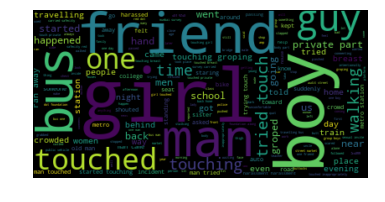

In [0]:
category = open('TouchingGroping.txt', 'r')
content = category.read().lower() 
# without filtering just A-Za-z, so it includes numbers and other characters

!pip install wordcloud

from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud().generate(content)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

#TODO: Apply no_stop word filter and a masked model: https://medium.com/dair-ai/building-your-first-wordcloud-with-google-colaboratory-and-python-b3c8c1be5883

In [0]:
# WordCloud for TouchingGroping
# create mask
alice_mask = np.array(Image.open('silhouette.png'))

# remove stopwords
stopwords = set(STOPWORDS)
stopwords.add("said") #add othes you might want

# generate word cloud
wc = WordCloud(background_color="white", max_words=400, mask=alice_mask,
               stopwords=stopwords)
wc.generate(content)

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

[('aa', 0.002918199884740667), ('abandoned', 0.007348554351325245), ('abduct', 0.033753481890285056), ('aboarded', 0.016876740945142528), ('aboy', 0.010865124525522525), ('abruptly', 0.007348554351325245), ('absence', 0.007348554351325245), ('absurd', 0.002918199884740667), ('abt', 0.01469710870265049), ('abusement', 0.016876740945142528), ('abuser', 0.010865124525522525), ('abuses', 0.011672799538962667), ('ac', 0.01469710870265049), ('accelerated', 0.016876740945142528), ('acceleration', 0.033753481890285056), ('accept', 0.002918199884740667), ('accepted', 0.0048535081059025206), ('accepting', 0.02173024905104505), ('accepts', 0.010865124525522525), ('accessibility', 0.010865124525522525), ('accident', 0.04368157295312269), ('accidental', 0.010865124525522525), ('accidentally', 0.017509199308444), ('accompanied', 0.02173024905104505), ('according', 0.010865124525522525), ('account', 0.0048535081059025206), ('accuse', 0.007348554351325245), ('accused', 0.004010813795115723), ('accusin

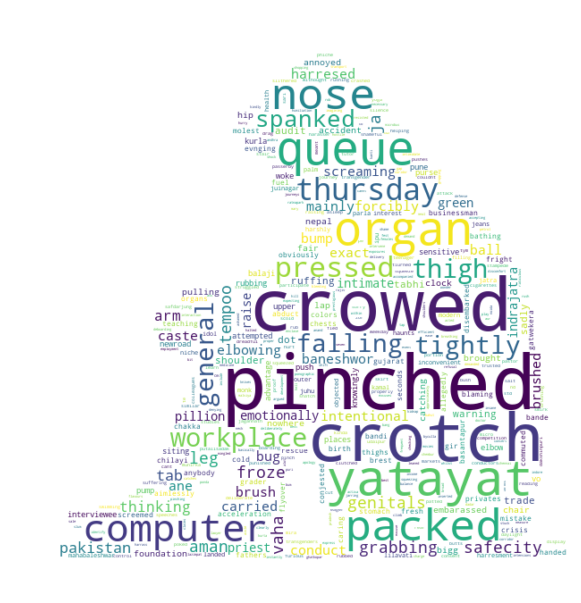

In [0]:
# WordCloud for TouchingGroping after tf-idf with generate_from_frequencies
tfidf_weights = tfidf[corpus[0]]
weights = [(dictionary[pair[0]], pair[1]) for pair in tfidf_weights]
print(weights)
print(type(weights))
print(type(weights[0]))
#sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)
#words = []
#for term_id, weight in sorted_tfidf_weights:
      #print(dictionary.get(term_id))
 #     words.append(dictionary.get(term_id))
#print(len(words))
#unique_string=(" ").join(words)
# create mask
alice_mask = np.array(Image.open('silhouette.png'))

# remove stopwords
#stopwords = set(STOPWORDS)

# generate word cloud
wc = WordCloud(background_color="white", max_words=400, mask=alice_mask,
               stopwords=stopwords.words("english"))
# try as well with stopwords= stopwords.words("english")
#wc.generate(unique_string)
wc.generate_from_frequencies(dict(weights))

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

[('aa', 0.005196989254746975), ('abuses', 0.005196989254746975), ('accept', 0.015590967764240925), ('accepted', 0.017287115667502885), ('accepts', 0.019349577698871842), ('accident', 0.008643557833751443), ('accidentally', 0.005196989254746975), ('acquaintance', 0.02617391509160128), ('across', 0.009523750722720953), ('activity', 0.01039397850949395), ('acts', 0.004761875361360477), ('actually', 0.007142813042040716), ('addict', 0.01308695754580064), ('address', 0.011904688403401193), ('adjacent', 0.005196989254746975), ('admi', 0.008643557833751443), ('admiring', 0.008643557833751443), ('adult', 0.008643557833751443), ('advances', 0.004761875361360477), ('advantage', 0.014285626084081432), ('affair', 0.005196989254746975), ('agree', 0.019349577698871842), ('alert', 0.005196989254746975), ('alight', 0.019349577698871842), ('alighted', 0.008643557833751443), ('alley', 0.0023809376806802384), ('allow', 0.0023809376806802384), ('allowed', 0.0023809376806802384), ('alongside', 0.0130869575

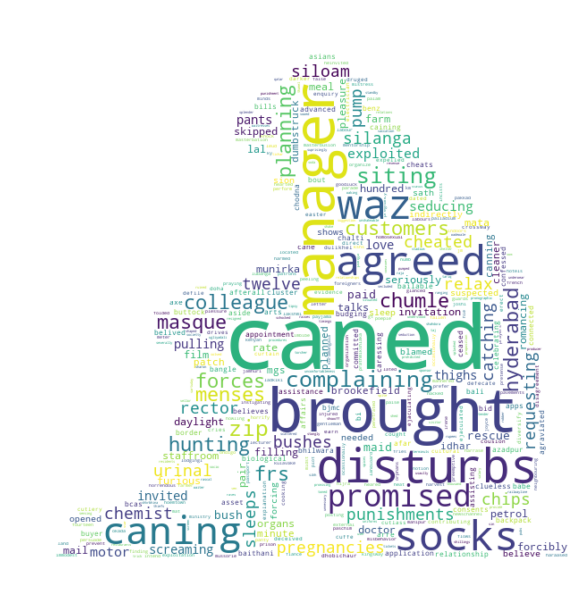

In [0]:
# WordCloud for SexualInvite after tf-idf with generate_from_frequencies
tfidf_weights = tfidf[corpus[2]]
weights = [(dictionary[pair[0]], pair[1]) for pair in tfidf_weights]
print(weights)
print(type(weights))
print(type(weights[0]))
#sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)
#words = []
#for term_id, weight in sorted_tfidf_weights:
      #print(dictionary.get(term_id))
 #     words.append(dictionary.get(term_id))
#print(len(words))
#unique_string=(" ").join(words)
# create mask
alice_mask = np.array(Image.open('silhouette.png'))

# remove stopwords
#stopwords = set(STOPWORDS)

# generate word cloud
wc = WordCloud(background_color="white", max_words=400, mask=alice_mask,
               stopwords=stopwords.words("english"))
# try as well with stopwords= stopwords.words("english")
#wc.generate(unique_string)
wc.generate_from_frequencies(dict(weights))

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Name Entity Recognition NER

In [0]:
category = open('TouchingGroping.txt', 'r')
content = category.read()

# Tokenize the article into sentences: sentences
sentences = nltk.sent_tokenize(content)

# Tokenize each sentence into words: token_sentences
token_sentences = [word_tokenize(sent) for sent in sentences]

# Tag each tokenized sentence into parts of speech: pos_sentences
pos_sentences = [nltk.pos_tag(sent) for sent in token_sentences] 

# Create the named entity chunks: chunked_sentences
chunked_sentences = nltk.ne_chunk_sents(pos_sentences , binary=False)

# Test for stems of the tree with tags or NE tag
for sent in chunked_sentences:
    for chunk in sent:
        if hasattr(chunk, "label"):# and chunk.label() == "NE":
            print(chunk)

# NNP is proper-noun-singular

(ORGANIZATION Andheri/NNP Station/NNP)
(PERSON Mumbai/NNP)
(ORGANIZATION PEOPLE/NNP)
(PERSON Employee/NNP)
(PERSON Doctor/NNP)
(PERSON James/NNP)
(GPE Benedict/NNP)
(PERSON Faith/NNP)
(PERSON Eucabeth/NNP)
(ORGANIZATION Schillerstraße/NNP)
(GPE Bayerstraße/NNP)
(GPE North/NNP)
(GPE Pettenkoferstraße/NNP)
(GPE Sonnenstraße/NNP)
(PERSON Roshan/NNP Kumar/NNP)
(ORGANIZATION Technical/JJ)
(ORGANIZATION Global/NNP Foundries/NNP)
(GPE Boys/NNP)
(PERSON Isme/NNP)
(PERSON Mahatma/NNP)
(ORGANIZATION IIGJ/NNP)
(GPE Mahabaleshwar/NNP)
(GPE Bhekavali/NNP)
(GPE Bandra/NNP)
(ORGANIZATION SQUEEZE/NNP)
(GPE Was/NNP)
(GPE Number/NNP)
(GPE Bhekavali/NNP)
(GPE Mahabaleshwar/NNP)
(GPE Was/NNP)
(PERSON Experienced/NNP Touching/NNP)
(PERSON Experienced/NNP Beating/NNP)
(ORGANIZATION Incident/NNP)
(ORGANIZATION Incident/NNP)
(GPE Incident/NN)
(ORGANIZATION Incident/NNP)
(ORGANIZATION Incident/NNP)
(ORGANIZATION वकतपर/NNP)
(GPE Lausanne/NNP)
(GPE Geneva/NNP)
(GPE Was/NNP)
(GPE Perfect/JJ)
(ORGANIZATION Ganesh/

['ORGANIZATION', 'PERSON', 'GPE', 'GSP', 'FACILITY', 'LOCATION']


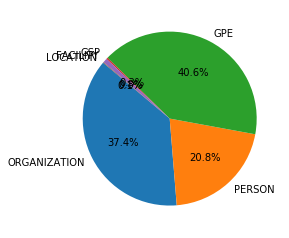

In [0]:
chunked_sentences = nltk.ne_chunk_sents(pos_sentences , binary=False)
# Create the defaultdict: ner_categories
ner_categories = defaultdict(int)

# Create the nested for loop
for sent in chunked_sentences:
    for chunk in sent:
        if hasattr(chunk, 'label'):
            ner_categories[chunk.label()] += 1
            
# Create a list from the dictionary keys for the chart labels: labels
labels = list(ner_categories.keys())
print(labels)
# Create a list of the values: values
values = [ner_categories.get(l) for l in labels]

# Create the pie chart
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)

# Display the chart
plt.show()

In [0]:
category = open('TouchingGroping.txt', 'r')
content = category.read()

# Entities of TouchingGroping DESCRIPTION collection
#Spacy: Different entity types compared to nltk, Informal language corpora, Easily find entities in Tweets and chat messages, Quickly growing!

import spacy
nlp = spacy.load('en')
nlp.entity
doc = nlp(content)
for ent in doc.ents:
    print(ent.label_, ent.text)

CARDINAL One
CARDINAL one
DATE 19th December 2017
QUANTITY 10.30 am
FAC Andheri Station
GPE Mumbai
TIME a few minutes
TIME a few seconds
CARDINAL 2
ORG Groping
PERSON Employee
TIME evening
PERSON James
DATE three year old
DATE three year old
DATE 15 year old
PRODUCT Benedict
ORG NAME
ORG NAME
ORDINAL first
CARDINAL seven
CARDINAL two hundred
PERSON Faith
TIME night
TIME every evening
TIME around 7:00
DATE the first day
ORDINAL second
ORDINAL third
CARDINAL three
PERSON Eucabeth
CARDINAL two
CARDINAL one
CARDINAL one
PERSON Z
CARDINAL One
TIME One morning
CARDINAL four
DATE four day
CARDINAL one
CARDINAL seven
CARDINAL six
NORP Teachers
ORDINAL first
DATE 2015
CARDINAL 2
DATE 2016
CARDINAL 2
CARDINAL 3
DATE 2017
CARDINAL one
DATE age 19
TIME the evening/night
DATE The quarter
ORG Schillerstraße
TIME about 9 p.m.
GPE Bayerstraße
ORG Paul-Heyse-Straße
GPE Sonnenstraße
CARDINAL one
PERSON Mr Roshan Kumar
ORG Technical Staff
ORG Global Foundries
DATE months
DATE months
CARDINAL Half
CARDINA

### Multilingual NER with polyglot

In [0]:
ptext = Text(content)
#ptext.entities
entities = [(ent.tag, ' '.join(ent)) for ent in ptext.entities]
# Print entities
print(entities)


[('I-LOC', 'Mumbai'), ('I-PER', 'James'), ('I-PER', 'urinated'), ('I-PER', 'Benedict'), ('I-PER', 'Faith'), ('I-PER', 'Eucabeth'), ('I-PER', 'accepted.He'), ('I-ORG', 'groupe'), ('I-LOC', 'Bayerstraße'), ('I-LOC', 'Pettenkoferstraße'), ('I-LOC', 'Paul'), ('I-LOC', 'Sonnenstraße'), ('I-PER', 'Mr Roshan Kumar'), ('I-ORG', 'Staff'), ('I-ORG', 'Global'), ('I-LOC', 'varanasi'), ('I-PER', 'winks'), ('I-LOC', 'pune'), ('I-LOC', 'jaipur'), ('I-PER', 'gandhi'), ('I-LOC', 'sitapura'), ('I-LOC', 'jaipur'), ('I-LOC', 'IIGJ'), ('I-LOC', 'bangalore'), ('I-LOC', '300metre'), ('I-LOC', '300metres'), ('I-LOC', 'Mahabaleshwar'), ('I-LOC', 'Bandra'), ('I-LOC', 'Mahabaleshwar'), ('I-PER', 'groped'), ('I-PER', 'ogling'), ('I-PER', 'indecently'), ('I-PER', 'कॉलेज'), ('I-PER', '। Guy'), ('I-LOC', 'Lausanne'), ('I-LOC', 'Geneva'), ('I-PER', 'kar galt'), ('I-PER', 'karte hani'), ('I-PER', 'Ganesh'), ('I-PER', 'groped'), ('I-PER', 'groped'), ('I-ORG', 'Jai Hind College'), ('I-ORG', 'Government Law College'), ('

### Supervised Text Classification
Using tf-idf feautures (weights)

In [44]:
#TODO: Check how to to multiple output and how to build a N.N in keras for the same task, which are the features and how I feed the N.N with it

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

report_1 = pd.read_csv('Safety_GPS1.csv')
report_1 = report_1[pd.notna(report_1['DESCRIPTION'])]

x_report_1 = report_1[report_1.columns[4]]
#y_report_1 = report_1[report_1.columns[14:30]] #including human_traficking and petty_robbery
y_report_1 = report_1[report_1.columns[14:28]]
y_report_1_one = report_1[report_1.columns[14]]
df_report_1 = pd.concat([x_report_1, y_report_1], axis=1, sort=False)

X_train, X_test, y_train, y_test = train_test_split(x_report_1, y_report_1, test_size=0.2, random_state=17)
count_vectorizer = CountVectorizer(stop_words='english') #or TfidfVectorizer(stop_words="english", max_df=0.7)
count_train = count_vectorizer.fit_transform(X_train.values)
count_test = count_vectorizer.transform(X_test.values)
print(count_vectorizer.get_feature_names()[:20])
print(count_train.A[:5]) #.A attribute is array

['00', '000', '00am', '00pm', '01', '02', '03', '05', '05th', '06', '07', '08', '0830', '08826862360', '09', '0900', '0930', '0f', '10', '100']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [42]:
categories = y_train.columns
print(categories)

Index(['Touching /Groping', 'Catcalls/Whistles', 'Sexual Invites', 'Stalking',
       'Others', 'Commenting', 'Rape / Sexual Assault',
       'North East India Report', 'Indecent Exposure/Masturbation in public',
       'Chain Snatching', 'Ogling/Facial Expressions/Staring',
       'Taking pictures', 'Poor / No Street Lighting', 'Online Harassment'],
      dtype='object')


In [13]:
print(count_train.shape)
print(y_train.shape)

(8844, 8894)
(8844,)


In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize a TfidfVectorizer object: tfidf_vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words="english", max_df=0.7)

# Transform the training data: tfidf_train 
tfidf_train = tfidf_vectorizer.fit_transform(X_train.values)

# Transform the test data: tfidf_test 
tfidf_test = tfidf_vectorizer.transform(X_test.values)

# Print the first 10 features
print(tfidf_vectorizer.get_feature_names()[:10])

# Print the first 5 vectors of the tfidf training data
print(tfidf_train.A[:5])

['00', '000', '00am', '00pm', '01', '02', '03', '05', '05th', '06']
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [46]:
# Create the CountVectorizer DataFrame: count_df
count_df = pd.DataFrame(count_train.A, columns=count_vectorizer.get_feature_names())

# Create the TfidfVectorizer DataFrame: tfidf_df
tfidf_df = pd.DataFrame(tfidf_train.A, columns=tfidf_vectorizer.get_feature_names())

# Print the head of count_df
print(count_df.head())

# Print the head of tfidf_df
print(tfidf_df.head())

# Calculate the difference in columns: difference
difference = set(count_df.columns) - set(tfidf_df.columns)
print(difference)

# Check whether the DataFrames are equal
print(count_df.equals(tfidf_df))

#TODO: remove not english and play with the alpha values for tf-idf

   00  000  00am  00pm  01  02  03  05  ...  वकत  वकतपर  वह  शयद  सम  समय  हम  हर
0   0    0     0     0   0   0   0   0  ...    0      0   0    0   0    0   0   0
1   0    0     0     0   0   0   0   0  ...    0      0   0    0   0    0   0   0
2   0    0     0     0   0   0   0   0  ...    0      0   0    0   0    0   0   0
3   0    0     0     0   0   0   0   0  ...    0      0   0    0   0    0   0   0
4   0    0     0     0   0   0   0   0  ...    0      0   0    0   0    0   0   0

[5 rows x 8894 columns]
    00  000  00am  00pm   01   02   03  ...  वकतपर   वह  शयद   सम  समय   हम   हर
0  0.0  0.0   0.0   0.0  0.0  0.0  0.0  ...    0.0  0.0  0.0  0.0  0.0  0.0  0.0
1  0.0  0.0   0.0   0.0  0.0  0.0  0.0  ...    0.0  0.0  0.0  0.0  0.0  0.0  0.0
2  0.0  0.0   0.0   0.0  0.0  0.0  0.0  ...    0.0  0.0  0.0  0.0  0.0  0.0  0.0
3  0.0  0.0   0.0   0.0  0.0  0.0  0.0  ...    0.0  0.0  0.0  0.0  0.0  0.0  0.0
4  0.0  0.0   0.0   0.0  0.0  0.0  0.0  ...    0.0  0.0  0.0  0.0  0.0  0.0  0

In [55]:
#Naive Bayes Classifier
#MultinomialNB for the countvectorizer (because it works well with integers)
#SVM or linear models for tf-idf

#I have to make it multiple output...

from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

nb_classifier = MultinomialNB() #alphas here, create a function to iterate over the alphas from 0 to 1 with steps 0.1 with np.arange()
nb_classifier.fit(count_train, y_train.iloc[:,0])
pred = nb_classifier.predict(count_test)
score = metrics.accuracy_score(y_test.iloc[:,0], pred)
print('Test accuracy is {}'.format(score))
metrics.confusion_matrix(y_test.iloc[:,0], pred) #how this would work for multiple outputs?

Test accuracy is 0.8611488014473089


array([[1497,   80],
       [ 227,  407]])

In [56]:
#Naive Bayes Classifier
#MultinomialNB for the countvectorizer (because it works well with integers)
#SVM or linear models for tf-idf

#I have to make it multiple output...

from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

nb_classifier = MultinomialNB() #alphas here, create a function to iterate over the alphas from 0 to 1 with steps 0.1 with np.arange()
nb_classifier.fit(tfidf_train, y_train.iloc[:,0])
pred = nb_classifier.predict(tfidf_test)
score = metrics.accuracy_score(y_test.iloc[:,0], pred)
print('Test accuracy is {}'.format(score))
metrics.confusion_matrix(y_test.iloc[:,0], pred, labels=[0,1]) #how this would work for multiple outputs?

Test accuracy is 0.80958842152872


array([[1552,   25],
       [ 396,  238]])

In [57]:
#Inspecting the model
# Get the class labels: class_labels
class_labels = nb_classifier.classes_

# Extract the features: feature_names
feature_names = tfidf_vectorizer.get_feature_names()

# Zip the feature names together with the coefficient array and sort by weights: feat_with_weights
feat_with_weights = sorted(zip(nb_classifier.coef_[0], feature_names))

print(class_labels, feat_with_weights[:20])

# Print the first class label and the top 20 feat_with_weights entries
#print(class_labels[0][:20], feat_with_weights[:20])

# Print the second class label and the bottom 20 feat_with_weights entries
#print(class_labels[1][-20:], feat_with_weights[-20:])


[0 1] [(-9.687577285651056, '000'), (-9.687577285651056, '03'), (-9.687577285651056, '05'), (-9.687577285651056, '05th'), (-9.687577285651056, '06'), (-9.687577285651056, '08'), (-9.687577285651056, '0830'), (-9.687577285651056, '08826862360'), (-9.687577285651056, '0900'), (-9.687577285651056, '0930'), (-9.687577285651056, '100'), (-9.687577285651056, '1000'), (-9.687577285651056, '10ht'), (-9.687577285651056, '110089'), (-9.687577285651056, '11pm'), (-9.687577285651056, '11th'), (-9.687577285651056, '12am'), (-9.687577285651056, '12th'), (-9.687577285651056, '12years'), (-9.687577285651056, '12yrs')]


In [58]:
# Define a pipeline combining a text feature extractor with multi lable classifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline

NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words='english')),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])

test_string = """"He started rubbing my shoulders, telling me I looked stressed. Then he went down in my shirt. 
                  He walked around the living room area and he came back. That is when he touched my breast.
                  Then he grabbed my waist of my pants and also grabbed my hair as I tried to leave. I made it to the door and left.
                  It happened so quickly. I was just trying to get out of the townhouse"""

for category in categories:
    print('... Processing {}'.format(category))
    # train the model using X_dtm & y
    NB_pipeline.fit(X_train, y_train[category])
    # compute the testing accuracy
    prediction = NB_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(metrics.accuracy_score(y_test[category], prediction)))

... Processing Touching /Groping
Test accuracy is 0.80958842152872
... Processing Catcalls/Whistles
Test accuracy is 0.8018995929443691
... Processing Sexual Invites
Test accuracy is 0.8959746720940751
... Processing Stalking
Test accuracy is 0.919041157847128
... Processing Others
Test accuracy is 0.8864767073722297
... Processing Commenting
Test accuracy is 0.7697874265038445
... Processing Rape / Sexual Assault
Test accuracy is 0.9461781999095432
... Processing North East India Report
Test accuracy is 0.9963817277250113
... Processing Indecent Exposure/Masturbation in public
Test accuracy is 0.937584803256445
... Processing Chain Snatching
Test accuracy is 0.9674355495251018
... Processing Ogling/Facial Expressions/Staring
Test accuracy is 0.798733604703754
... Processing Taking pictures
Test accuracy is 0.9253731343283582
... Processing Poor / No Street Lighting
Test accuracy is 0.9656264133876075
... Processing Online Harassment
Test accuracy is 1.0


In [59]:
# Define a pipeline combining a text feature extractor with multi lable classifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline

NB_pipeline = Pipeline([('count', CountVectorizer(stop_words='english')), ('clf', OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None))),])
for category in categories:
    print('... Processing {}'.format(category))
    # train the model using X_dtm & y
    NB_pipeline.fit(X_train, y_train[category])
    # compute the testing accuracy
    prediction = NB_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(metrics.accuracy_score(y_test[category], prediction)))

... Processing Touching /Groping
Test accuracy is 0.8611488014473089
... Processing Catcalls/Whistles
Test accuracy is 0.8132066938037087
... Processing Sexual Invites
Test accuracy is 0.8941655359565808
... Processing Stalking
Test accuracy is 0.9199457259158752
... Processing Others
Test accuracy is 0.8891904115784712
... Processing Commenting
Test accuracy is 0.7815468113975577
... Processing Rape / Sexual Assault
Test accuracy is 0.9493441881501583
... Processing North East India Report
Test accuracy is 0.9950248756218906
... Processing Indecent Exposure/Masturbation in public
Test accuracy is 0.942107643600181
... Processing Chain Snatching
Test accuracy is 0.9787426503844414
... Processing Ogling/Facial Expressions/Staring
Test accuracy is 0.8227046585255541
... Processing Taking pictures
Test accuracy is 0.9434644957033017
... Processing Poor / No Street Lighting
Test accuracy is 0.9701492537313433
... Processing Online Harassment
Test accuracy is 0.9990954319312528


In [62]:
# Define a pipeline combining a text feature extractor with multi lable classifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline

NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words='english')),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])

test_string = [""""He started rubbing my shoulders, telling me I looked stressed. Then he went down in my shirt. 
                  He walked around the living room area and he came back. That is when he touched my breast.
                  Then he grabbed my waist of my pants and also grabbed my hair as I tried to leave. I made it to the door and left.
                  It happened so quickly. I was just trying to get out of the townhouse"""]

for category in categories:
    print('... Processing {}'.format(category))
    # train the model using X_dtm & y
    NB_pipeline.fit(X_train, y_train[category])
    # compute the testing accuracy
    prediction = NB_pipeline.predict(test_string)
    print('Prediction is {}'.format(prediction))

... Processing Touching /Groping
Prediction is [1]
... Processing Catcalls/Whistles
Prediction is [0]
... Processing Sexual Invites
Prediction is [0]
... Processing Stalking
Prediction is [0]
... Processing Others
Prediction is [0]
... Processing Commenting
Prediction is [0]
... Processing Rape / Sexual Assault
Prediction is [0]
... Processing North East India Report
Prediction is [0]
... Processing Indecent Exposure/Masturbation in public
Prediction is [0]
... Processing Chain Snatching
Prediction is [0]
... Processing Ogling/Facial Expressions/Staring
Prediction is [0]
... Processing Taking pictures
Prediction is [0]
... Processing Poor / No Street Lighting
Prediction is [0]
... Processing Online Harassment
Prediction is [0]
